<a href="https://www.kaggle.com/code/fatsassabila/endtermtask?scriptVersionId=213707084" target="_blank"><img align="left" alt="Kaggle" title="Open in Kaggle" src="https://kaggle.com/static/images/open-in-kaggle.svg"></a>

# Generative Adversarial Networkn

Name: Fatsa Vidyaningtyas Sabila

NPM: 2306319445

In [4]:
import torch
import torch.nn as nn
import torch.nn.functional as F
import matplotlib.pyplot as plt
import cv2
import glob
import numpy as np

torch.manual_seed(300)

In [5]:
# Dataset from https://www.kaggle.com/datasets/moltean/fruits
# Only used the apple images
path = '/kaggle/input/fruits/fruits-360_dataset_100x100/fruits-360/Training'
#path = '/kaggle/input/fruits/fruits-360_dataset_original-size/fruits-360/Training'
# img_paths = glob.glob(path + "/Apple*/*jpg")

# Apple

In [41]:
img_paths = glob.glob(path + "/Apple Red*/*jpg")

In [42]:
# Resizing images and converting to RGB array
img_list = []
for i in img_paths[:]:
    try:
        img = cv2.imread(i) 
        img = cv2.resize(img, (64,64)) # Resizing
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB) # Converting to RGB
        img_list.append(img)
    except:
        pass

paints = np.stack(img_list, axis=-1)

In [43]:
# Converting images to a tensor (Img #, RGB #, pixel rows, pixel columns)
paints = paints.transpose(3, 2, 0, 1)
paints = torch.from_numpy(paints).int()
print(paints.shape)

torch.Size([3067, 3, 64, 64])


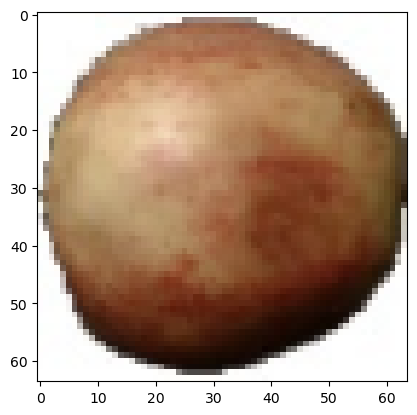

In [46]:
# Plotting one of the training images
plt.imshow(paints[190].transpose(0, 2))

torch.Size([3067, 3, 64, 64])


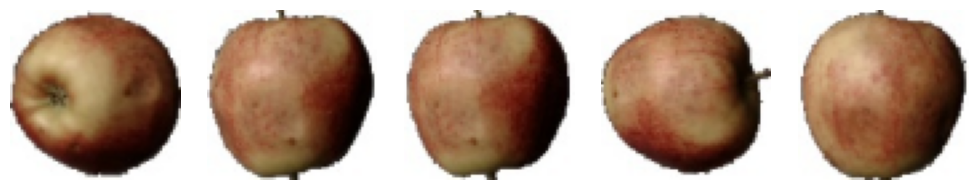

In [50]:
import cv2
import glob
import numpy as np
import torch
import matplotlib.pyplot as plt

# Path to the apple images
img_paths = glob.glob(path + "/Apple Red*/*jpg")

# Resizing images and converting to RGB array
img_list = []
for i in img_paths[:]:
    try:
        img = cv2.imread(i)
        img = cv2.resize(img, (64,64))  # Resizing to 64x64
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)  # Converting to RGB
        img_list.append(img)
    except:
        pass

# Stack images and convert to tensor
paints = np.stack(img_list, axis=-1)
paints = paints.transpose(3, 2, 0, 1)
paints = torch.from_numpy(paints).int()

# Print the shape of the tensor
print(paints.shape)

# Displaying the first 5 images in 1 row and 5 columns
plt.figure(figsize=(10, 2))  # Adjusted figure size for horizontal display
for i in range(5):
    plt.subplot(1, 5, i+1)
    plt.imshow(paints[i].permute(1, 2, 0))  # Convert tensor format to [H, W, C] for plotting
    plt.axis('off')  # Hide axes
plt.tight_layout()  # Adjust the spacing
plt.show()


In [13]:
class Descriminator(nn.Module):
    def __init__(self):
        super().__init__()
        self.conv = nn.Sequential(
            nn.Conv2d(3, 6, kernel_size=4, stride=2, padding=1, bias=False),
            nn.BatchNorm2d(6),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Conv2d(6, 12, kernel_size=4, stride=2, padding=1, bias=False),
            nn.BatchNorm2d(12),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Conv2d(12, 24, kernel_size=4, stride=2, padding=1, bias=False),
            nn.BatchNorm2d(24),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Conv2d(24, 48, kernel_size=4, stride=2, padding=1, bias=False),
            nn.BatchNorm2d(48),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Conv2d(48, 96, kernel_size=4, stride=2, padding=1, bias=False),
            nn.BatchNorm2d(96),
            nn.LeakyReLU(0.2, inplace=True)
        )
        self.linear1 = nn.Linear(384, 60)
        self.linear2 = nn.Linear(60, 1)

    def forward(self, x):
        x = self.conv(x)
        x = x.view(-1, 384)
        x = self.linear1(x)
        x = F.relu(x) + x # 
        x = F.dropout(x, 0.3) # Prevents descriminator from overfitting the real images
        x = self.linear2(x)
        x = torch.sigmoid(x)
        return x

# Testing the output. Descriminator should return a value between 0 and 1 for classifying an image as fake or real
model = Descriminator()
model(paints[:3].float())

tensor([[0.4730],
        [0.2596],
        [0.2690]], grad_fn=<SigmoidBackward0>)

In [58]:
import pandas as pd

# Define the table structure
data = {
    "Layer Type": [
        "Convolutional Layer + BatchNorm + LeakyReLU",
        "Convolutional Layer + BatchNorm + LeakyReLU",
        "Convolutional Layer + BatchNorm + LeakyReLU",
        "Convolutional Layer + BatchNorm + LeakyReLU",
        "Convolutional Layer + BatchNorm + LeakyReLU",
        "Linear Layer",
        "Residual Addition + Dropout",
        "Final Linear Layer",
        "Activation (Sigmoid)"
    ],
    "Description": [
        "Extracts features using 4x4 kernels (stride=2) and applies BatchNorm for normalization, followed by LeakyReLU for non-linearity.",
        "Further feature extraction with 6 -> 12 channels, including normalization and non-linearity.",
        "Continues feature extraction from 12 -> 24 channels.",
        "Expands feature depth to 48 channels with similar operations.",
        "Final convolutional layer expands feature depth to 96 channels.",
        "Fully connected layer reducing feature size from 384 to 60.",
        "Residual addition (skipped connection) ensures smoother gradient flow. Dropout added to reduce overfitting.",
        "Reduces output to a single value for binary classification.",
        "Maps output to range [0, 1] to represent the probability of the input image being real."
    ]
}

# Convert to DataFrame for better display
df = pd.DataFrame(data)
pd.set_option('display.max_colwidth', None)
df


,Layer Type,Description
0,Convolutional Layer + BatchNorm + LeakyReLU,"Extracts features using 4x4 kernels (stride=2) and applies BatchNorm for normalization, followed by LeakyReLU for non-linearity."
1,Convolutional Layer + BatchNorm + LeakyReLU,"Further feature extraction with 6 -> 12 channels, including normalization and non-linearity."
2,Convolutional Layer + BatchNorm + LeakyReLU,Continues feature extraction from 12 -> 24 channels.
3,Convolutional Layer + BatchNorm + LeakyReLU,Expands feature depth to 48 channels with similar operations.
4,Convolutional Layer + BatchNorm + LeakyReLU,Final convolutional layer expands feature depth to 96 channels.
5,Linear Layer,Fully connected layer reducing feature size from 384 to 60.
6,Residual Addition + Dropout,Residual addition (skipped connection) ensures smoother gradient flow. Dropout added to reduce overfitting.
7,Final Linear Layer,Reduces output to a single value for binary classification.
8,Activation (Sigmoid),"Maps output to range [0, 1] to represent the probability of the input image being real."


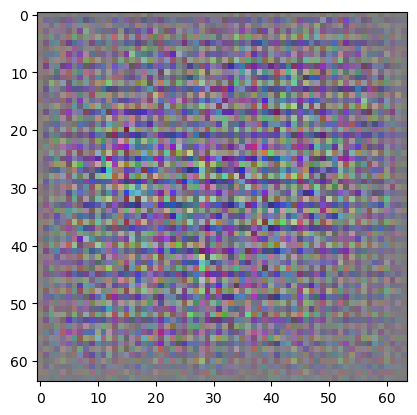

In [14]:
class Generator(nn.Module):
    def __init__(self):
        super().__init__()
        self.linear1 = nn.Linear(100, 2*2*240)  
        self.convt = nn.Sequential(
            nn.ConvTranspose2d(240, 120, kernel_size=4, stride=2, padding=1, bias=False), # 4 x 4
            nn.BatchNorm2d(120),
            nn.ReLU(inplace=True),
            nn.ConvTranspose2d(120, 60, kernel_size=4, stride=2, padding=1, bias=False), # 8 x 8
            nn.BatchNorm2d(60),
            nn.ReLU(inplace=True),
            nn.ConvTranspose2d(60, 30, kernel_size=4, stride=2, padding=1, bias=False), # 16 x 16
            nn.BatchNorm2d(30),
            nn.ReLU(inplace=True),
            nn.ConvTranspose2d(30, 15, kernel_size=4, stride=2, padding=1, bias=False), # 32 x 32
            nn.BatchNorm2d(15),
            nn.ReLU(inplace=True),
            nn.ConvTranspose2d(15, 3, kernel_size=4, stride=2, padding=1, bias=False), # 64 x 64
            nn.Sigmoid()
        )

    def forward(self, x):
        x = self.linear1(x)
        x = x.view(-1, 240, 2, 2)
        x = self.convt(x)
        return x

# Testing the ouput
model = Generator()
output = model(torch.rand(size=(100,)))
first_img = torch.transpose(output[0], 0, 2).detach().numpy()
plt.imshow(first_img)

In [60]:
import pandas as pd

# Define the Generator structure in a DataFrame
data = {
    "Layer Type": [
        "Linear Layer",
        "Reshape",
        "ConvTranspose2d + BatchNorm + ReLU",
        "ConvTranspose2d + BatchNorm + ReLU",
        "ConvTranspose2d + BatchNorm + ReLU",
        "ConvTranspose2d + BatchNorm + ReLU",
        "ConvTranspose2d + Sigmoid Activation"
    ],
    "Description": [
        "Transforms the input noise vector of size 100 into a tensor of size 2 x 2 x 240, initializing the feature space.",
        "Reshapes the linear output into a tensor with dimensions [240, 2, 2] to prepare for transposed convolutions.",
        "Upsamples from 2 x 2 to 4 x 4 with 240 -> 120 feature maps, using ConvTranspose2d, followed by BatchNorm and ReLU for stability and non-linearity.",
        "Upsamples from 4 x 4 to 8 x 8 with 120 -> 60 feature maps, applying the same operations.",
        "Upsamples from 8 x 8 to 16 x 16 with 60 -> 30 feature maps, continuing to expand spatial dimensions.",
        "Upsamples from 16 x 16 to 32 x 32 with 30 -> 15 feature maps, ensuring features are refined at every stage.",
        "Final layer upsamples to 64 x 64 resolution with 15 -> 3 feature maps (RGB channels) and applies a sigmoid activation to scale pixel values to [0, 1]."
    ]
}

df2 = pd.DataFrame(data)

# Adjust pandas options to prevent truncation
pd.set_option('display.max_colwidth', None)
df2


,Layer Type,Description
0,Linear Layer,"Transforms the input noise vector of size 100 into a tensor of size 2 x 2 x 240, initializing the feature space."
1,Reshape,"Reshapes the linear output into a tensor with dimensions [240, 2, 2] to prepare for transposed convolutions."
2,ConvTranspose2d + BatchNorm + ReLU,"Upsamples from 2 x 2 to 4 x 4 with 240 -> 120 feature maps, using ConvTranspose2d, followed by BatchNorm and ReLU for stability and non-linearity."
3,ConvTranspose2d + BatchNorm + ReLU,"Upsamples from 4 x 4 to 8 x 8 with 120 -> 60 feature maps, applying the same operations."
4,ConvTranspose2d + BatchNorm + ReLU,"Upsamples from 8 x 8 to 16 x 16 with 60 -> 30 feature maps, continuing to expand spatial dimensions."
5,ConvTranspose2d + BatchNorm + ReLU,"Upsamples from 16 x 16 to 32 x 32 with 30 -> 15 feature maps, ensuring features are refined at every stage."
6,ConvTranspose2d + Sigmoid Activation,"Final layer upsamples to 64 x 64 resolution with 15 -> 3 feature maps (RGB channels) and applies a sigmoid activation to scale pixel values to [0, 1]."


In [15]:
# Initializing generator, descriminator, and data loader. 
device = 'cuda' if torch.cuda.is_available() else 'cpu'
batch_size = 10
generator = Generator().to(device)
descriminator = Descriminator().to(device)
paints = paints.to(device)
dataloader = torch.utils.data.DataLoader(paints, batch_size=batch_size, shuffle=True)     

Gen Loss: tensor(1.5555, device='cuda:0', grad_fn=<MeanBackward0>)
Des Loss: tensor(1.3258, device='cuda:0', grad_fn=<MeanBackward0>)


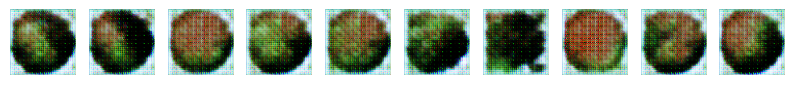

Gen Loss: tensor(1.4937, device='cuda:0', grad_fn=<MeanBackward0>)
Des Loss: tensor(1.2712, device='cuda:0', grad_fn=<MeanBackward0>)


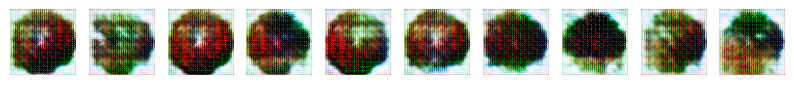

Gen Loss: tensor(1.3517, device='cuda:0', grad_fn=<MeanBackward0>)
Des Loss: tensor(1.2620, device='cuda:0', grad_fn=<MeanBackward0>)


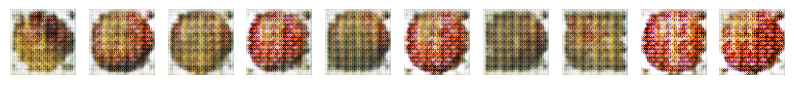

Gen Loss: tensor(1.2795, device='cuda:0', grad_fn=<MeanBackward0>)
Des Loss: tensor(1.2644, device='cuda:0', grad_fn=<MeanBackward0>)


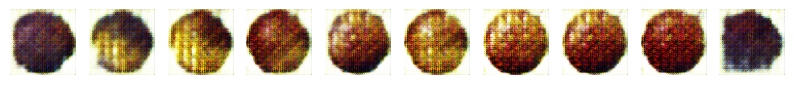

Gen Loss: tensor(1.2098, device='cuda:0', grad_fn=<MeanBackward0>)
Des Loss: tensor(1.2927, device='cuda:0', grad_fn=<MeanBackward0>)


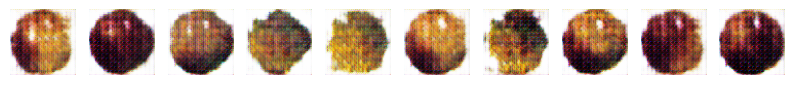

Gen Loss: tensor(1.3204, device='cuda:0', grad_fn=<MeanBackward0>)
Des Loss: tensor(1.2562, device='cuda:0', grad_fn=<MeanBackward0>)


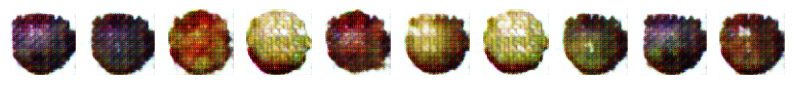

Gen Loss: tensor(1.4185, device='cuda:0', grad_fn=<MeanBackward0>)
Des Loss: tensor(1.2369, device='cuda:0', grad_fn=<MeanBackward0>)


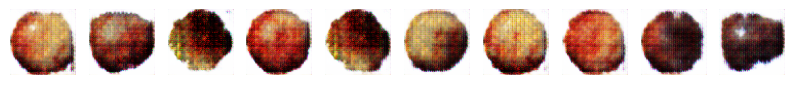

Gen Loss: tensor(1.4121, device='cuda:0', grad_fn=<MeanBackward0>)
Des Loss: tensor(1.2263, device='cuda:0', grad_fn=<MeanBackward0>)


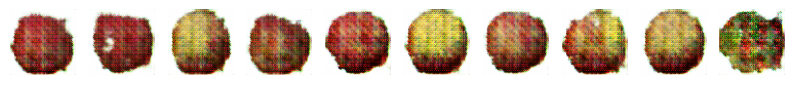

Gen Loss: tensor(1.4097, device='cuda:0', grad_fn=<MeanBackward0>)
Des Loss: tensor(1.2228, device='cuda:0', grad_fn=<MeanBackward0>)


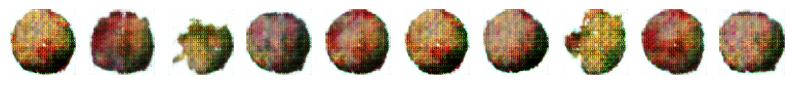

Gen Loss: tensor(1.6542, device='cuda:0', grad_fn=<MeanBackward0>)
Des Loss: tensor(1.1466, device='cuda:0', grad_fn=<MeanBackward0>)


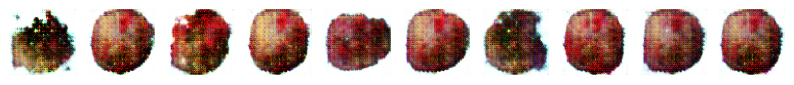

In [63]:
# Training Loop   
def training_loop(gen_lr, des_lr, epochs):
    
    # Initializing the optimizers 
    gen_opt = torch.optim.AdamW(generator.parameters(), lr=gen_lr, betas=(0.5,0.999))
    des_opt = torch.optim.AdamW(descriminator.parameters(), lr=des_lr, betas=(0.5,0.999))      
        
    for epoch in range(epochs):
        g_loss_list = []
        d_loss_list = []
    
        for i, batch in enumerate(dataloader, 0):
            
            # Training the descriminator on the real images
            des_opt.zero_grad(set_to_none=True)
            predict = descriminator(batch.float())
            d_loss = F.binary_cross_entropy(predict, torch.ones((len(predict),1), device=device)) 
            d_loss.backward()
            
            # Training the descriminator on the fake images
            rand_noise = torch.randn(batch_size, 100, device=device)
            gen_img = generator(rand_noise)
            predict = descriminator(gen_img.detach().to(device))
            d_loss_fake = F.binary_cross_entropy(predict,torch.zeros((len(predict),1), device=device))
            d_loss_fake.backward()
            des_opt.step()
        
            # Training the generator on the descriminator's feedback
            gen_opt.zero_grad(set_to_none=True)
            predict = descriminator(gen_img)
            g_loss = F.binary_cross_entropy(predict,torch.ones((len(predict),1), device=device))
            g_loss.backward()
            gen_opt.step()
            
            # Storing the losses
            g_loss_list.append(g_loss)
            d_loss_list.append(d_loss + d_loss_fake)

        # Print the avg loss for the epoch
        print('Gen Loss:', torch.mean(torch.stack(g_loss_list))) 
        print('Des Loss:', torch.mean(torch.stack(d_loss_list)))
        
        # Plot 10 fake apples
        fig, axes = plt.subplots(nrows=1, ncols=10, figsize=(10,1))
        for i in range(10):
            axes[i].axis('off')
            axes[i].imshow(torch.transpose(gen_img[i], 0, 2).cpu().detach().numpy())
        plt.show()
    
training_loop(.007, .007, 10)

Epoch 1/10
Gen Loss: 3.5421
Des Loss: 0.4532


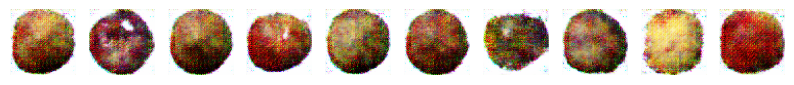

Epoch 2/10
Gen Loss: 3.4221
Des Loss: 0.4644


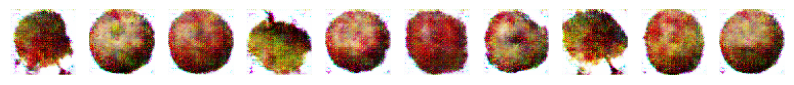

Epoch 3/10
Gen Loss: 3.5540
Des Loss: 0.4471


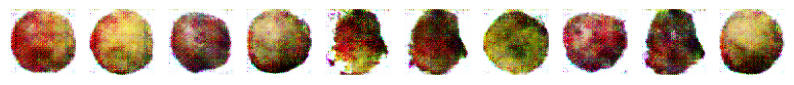

Epoch 4/10
Gen Loss: 3.9033
Des Loss: 0.4142


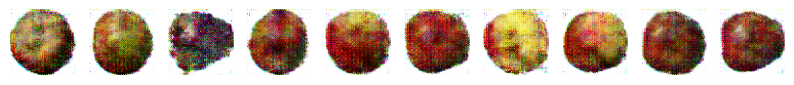

Epoch 5/10
Gen Loss: 3.7942
Des Loss: 0.3936


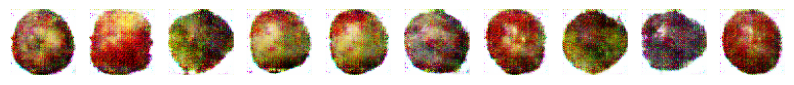

Epoch 6/10
Gen Loss: 3.9055
Des Loss: 0.4388


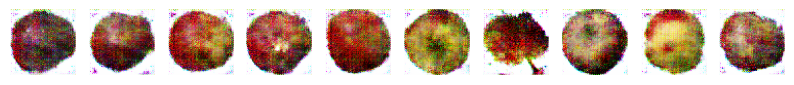

Epoch 7/10
Gen Loss: 3.7689
Des Loss: 0.4101


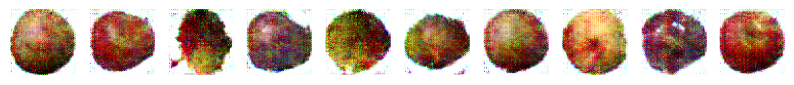

Epoch 8/10
Gen Loss: 3.9173
Des Loss: 0.3861


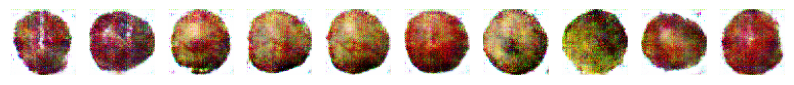

Epoch 9/10
Gen Loss: 4.1618
Des Loss: 0.3352


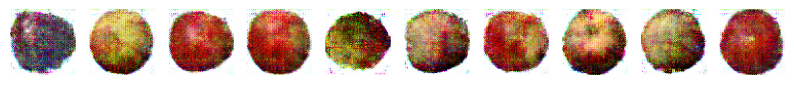

Epoch 10/10
Gen Loss: 4.3592
Des Loss: 0.3325


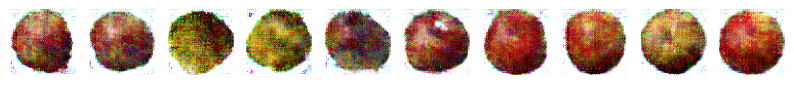

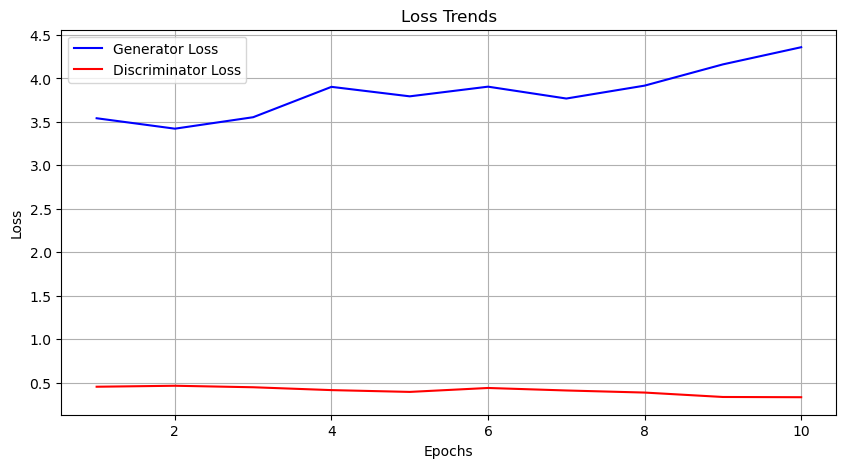

In [65]:
# Training Loop   
def training_loop(gen_lr, des_lr, epochs):
    # Initializing the optimizers 
    gen_opt = torch.optim.AdamW(generator.parameters(), lr=gen_lr, betas=(0.5, 0.999))
    des_opt = torch.optim.AdamW(descriminator.parameters(), lr=des_lr, betas=(0.5, 0.999))      
    
    g_loss_history = []
    d_loss_history = []

    for epoch in range(epochs):
        g_loss_list = []
        d_loss_list = []
    
        for i, batch in enumerate(dataloader, 0):
            # Training the discriminator on the real images
            des_opt.zero_grad(set_to_none=True)
            predict = descriminator(batch.float())
            d_loss_real = F.binary_cross_entropy(predict, torch.ones((len(predict), 1), device=device)) 
            d_loss_real.backward()

            # Training the discriminator on the fake images
            rand_noise = torch.randn(batch_size, 100, device=device)
            gen_img = generator(rand_noise)
            predict = descriminator(gen_img.detach().to(device))
            d_loss_fake = F.binary_cross_entropy(predict, torch.zeros((len(predict), 1), device=device))
            d_loss_fake.backward()
            des_opt.step()
            
            # Total discriminator loss
            d_loss = d_loss_real + d_loss_fake
            d_loss_list.append(d_loss)

            # Training the generator on the discriminator's feedback
            gen_opt.zero_grad(set_to_none=True)
            predict = descriminator(gen_img)
            g_loss = F.binary_cross_entropy(predict, torch.ones((len(predict), 1), device=device))
            g_loss.backward()
            gen_opt.step()
            
            # Storing the generator loss
            g_loss_list.append(g_loss)

        # Calculate and store average losses for the epoch
        avg_g_loss = torch.mean(torch.stack(g_loss_list))
        avg_d_loss = torch.mean(torch.stack(d_loss_list))
        g_loss_history.append(avg_g_loss.item())
        d_loss_history.append(avg_d_loss.item())

        # Print the average loss for the epoch
        print(f'Epoch {epoch+1}/{epochs}')
        print(f'Gen Loss: {avg_g_loss:.4f}') 
        print(f'Des Loss: {avg_d_loss:.4f}')
        
        # Plot 10 fake apples (generated images)
        fig, axes = plt.subplots(nrows=1, ncols=10, figsize=(10, 1))
        for i in range(10):
            axes[i].axis('off')
            axes[i].imshow(torch.transpose(gen_img[i], 0, 2).cpu().detach().numpy())
        plt.show()
    
    # Plot the loss trends after training
    plt.figure(figsize=(10, 5))
    plt.plot(range(1, epochs + 1), g_loss_history, label='Generator Loss', color='blue')
    plt.plot(range(1, epochs + 1), d_loss_history, label='Discriminator Loss', color='red')
    plt.title('Loss Trends')
    plt.xlabel('Epochs')
    plt.ylabel('Loss')
    plt.legend()
    plt.grid(True)
    plt.show()

# Run the training loop
training_loop(.001, .001, 10)


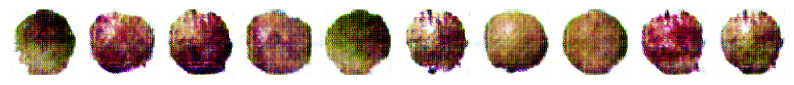

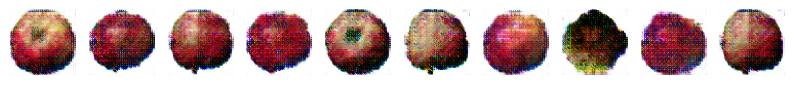

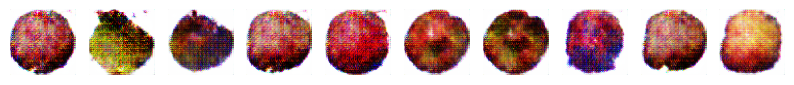

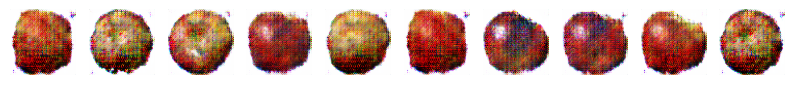

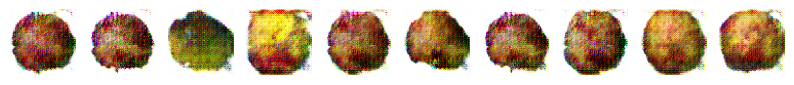

...

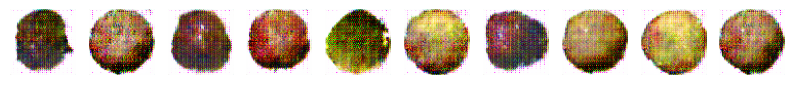

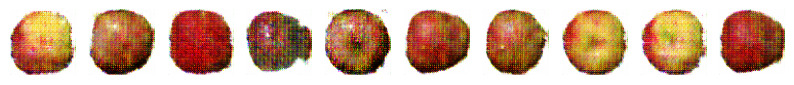

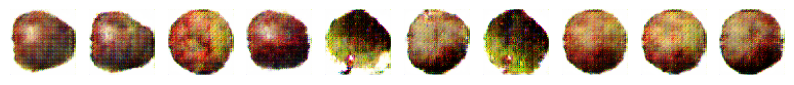

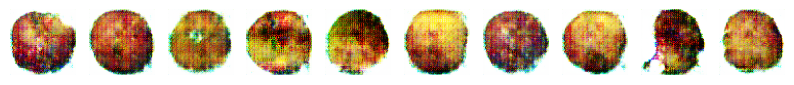

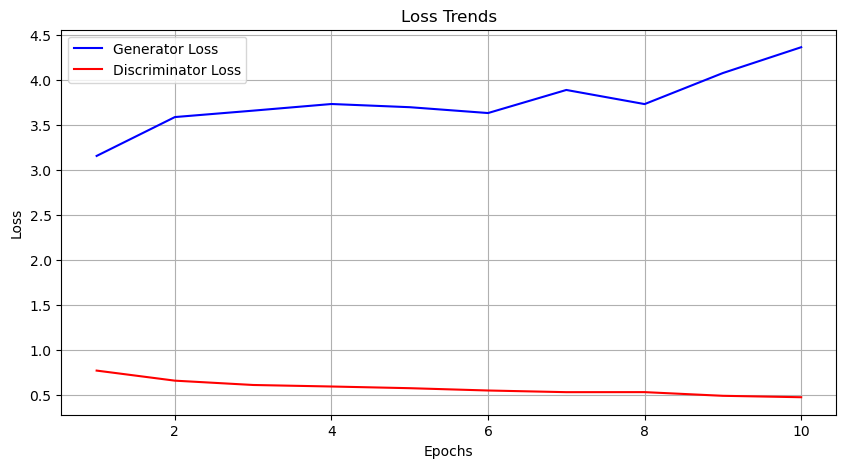

In [17]:
# Training Loop   
def training_loop(gen_lr, des_lr, epochs):
    # Initializing the optimizers 
    gen_opt = torch.optim.AdamW(generator.parameters(), lr=gen_lr, betas=(0.5, 0.999))
    des_opt = torch.optim.AdamW(descriminator.parameters(), lr=des_lr, betas=(0.5, 0.999))      
    
    g_loss_history = []
    d_loss_history = []

    for epoch in range(epochs):
        g_loss_list = []
        d_loss_list = []
    
        for i, batch in enumerate(dataloader, 0):
            # Training the discriminator on the real images
            des_opt.zero_grad(set_to_none=True)
            predict = descriminator(batch.float())
            d_loss_real = F.binary_cross_entropy(predict, torch.ones((len(predict), 1), device=device)) 
            d_loss_real.backward()

            # Training the discriminator on the fake images
            rand_noise = torch.randn(batch_size, 100, device=device)
            gen_img = generator(rand_noise)
            predict = descriminator(gen_img.detach().to(device))
            d_loss_fake = F.binary_cross_entropy(predict, torch.zeros((len(predict), 1), device=device))
            d_loss_fake.backward()
            des_opt.step()
            
            # Total discriminator loss
            d_loss = d_loss_real + d_loss_fake
            d_loss_list.append(d_loss)

            # Training the generator on the discriminator's feedback
            gen_opt.zero_grad(set_to_none=True)
            predict = descriminator(gen_img)
            g_loss = F.binary_cross_entropy(predict, torch.ones((len(predict), 1), device=device))
            g_loss.backward()
            gen_opt.step()
            
            # Storing the generator loss
            g_loss_list.append(g_loss)

        # Calculate and store average losses for the epoch
        avg_g_loss = torch.mean(torch.stack(g_loss_list))
        avg_d_loss = torch.mean(torch.stack(d_loss_list))
        g_loss_history.append(avg_g_loss.item())
        d_loss_history.append(avg_d_loss.item())

        # # Print the average loss for the epoch
        # print(f'Epoch {epoch+1}/{epochs}')
        # print(f'Gen Loss: {avg_g_loss:.4f}') 
        # print(f'Des Loss: {avg_d_loss:.4f}')
        
        # Plot 10 fake apples (generated images)
        fig, axes = plt.subplots(nrows=1, ncols=10, figsize=(10, 2))
        for i in range(10):
            axes[i].axis('off')
            axes[i].imshow(torch.transpose(gen_img[i], 0, 2).cpu().detach().numpy())
        plt.show()
    
    # Plot the loss trends after training
    plt.figure(figsize=(10, 5))
    plt.plot(range(1, epochs + 1), g_loss_history, label='Generator Loss', color='blue')
    plt.plot(range(1, epochs + 1), d_loss_history, label='Discriminator Loss', color='red')
    plt.title('Loss Trends')
    plt.xlabel('Epochs')
    plt.ylabel('Loss')
    plt.legend()
    plt.grid(True)
    plt.show()

# Run the training loop
training_loop(.007, .007, 10)


# Lemon

In [22]:
# Dataset from https://www.kaggle.com/datasets/moltean/fruits
# Only used the apple images
path = '/kaggle/input/fruits/fruits-360_dataset_100x100/fruits-360/Training'
img_paths = glob.glob(path + "/Lemon*/*jpg")

In [23]:
# Resizing images and converting to RGB array
img_list = []
for i in img_paths[:]:
    try:
        img = cv2.imread(i) 
        img = cv2.resize(img, (64,64)) # Resizing
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB) # Converting to RGB
        img_list.append(img)
    except:
        pass

paints = np.stack(img_list, axis=-1)

In [24]:
# Converting images to a tensor (Img #, RGB #, pixel rows, pixel columns)
paints = paints.transpose(3, 2, 0, 1)
paints = torch.from_numpy(paints).int()
print(paints.shape)

torch.Size([982, 3, 64, 64])


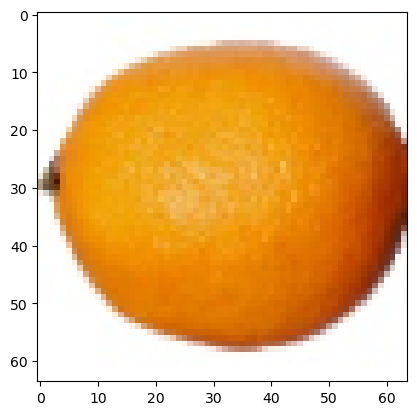

In [25]:
# Plotting one of the training images
plt.imshow(paints[0].transpose(0, 2))


torch.Size([982, 3, 64, 64])


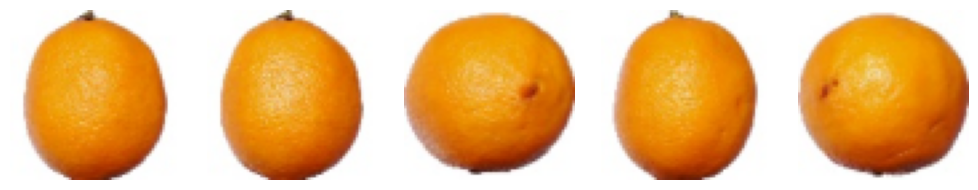

In [49]:
import cv2
import glob
import numpy as np
import torch
import matplotlib.pyplot as plt

# Path to the apple images
img_paths = glob.glob(path + "/Lemon*/*jpg")

# Resizing images and converting to RGB array
img_list = []
for i in img_paths[:]:
    try:
        img = cv2.imread(i)
        img = cv2.resize(img, (64,64))  # Resizing to 64x64
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)  # Converting to RGB
        img_list.append(img)
    except:
        pass

# Stack images and convert to tensor
paints = np.stack(img_list, axis=-1)
paints = paints.transpose(3, 2, 0, 1)
paints = torch.from_numpy(paints).int()

# Print the shape of the tensor
print(paints.shape)

# Displaying the first 5 images in 1 row and 5 columns
plt.figure(figsize=(10, 2))  # Adjusted figure size for horizontal display
for i in range(5):
    plt.subplot(1, 5, i+1)
    plt.imshow(paints[i].permute(1, 2, 0))  # Convert tensor format to [H, W, C] for plotting
    plt.axis('off')  # Hide axes
plt.tight_layout()  # Adjust the spacing
plt.show()


In [26]:
class Descriminator(nn.Module):
    def __init__(self):
        super().__init__()
        self.conv = nn.Sequential(
            nn.Conv2d(3, 6, kernel_size=4, stride=2, padding=1, bias=False),
            nn.BatchNorm2d(6),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Conv2d(6, 12, kernel_size=4, stride=2, padding=1, bias=False),
            nn.BatchNorm2d(12),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Conv2d(12, 24, kernel_size=4, stride=2, padding=1, bias=False),
            nn.BatchNorm2d(24),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Conv2d(24, 48, kernel_size=4, stride=2, padding=1, bias=False),
            nn.BatchNorm2d(48),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Conv2d(48, 96, kernel_size=4, stride=2, padding=1, bias=False),
            nn.BatchNorm2d(96),
            nn.LeakyReLU(0.2, inplace=True)
        )
        self.linear1 = nn.Linear(384, 60)
        self.linear2 = nn.Linear(60, 1)

    def forward(self, x):
        x = self.conv(x)
        x = x.view(-1, 384)
        x = self.linear1(x)
        x = F.relu(x) + x # 
        x = F.dropout(x, 0.3) # Prevents descriminator from overfitting the real images
        x = self.linear2(x)
        x = torch.sigmoid(x)
        return x

# Testing the output. Descriminator should return a value between 0 and 1 for classifying an image as fake or real
model = Descriminator()
model(paints[:3].float())

tensor([[0.5933],
        [0.3913],
        [0.5297]], grad_fn=<SigmoidBackward0>)

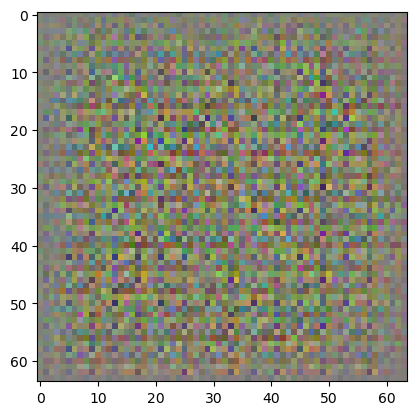

In [27]:
class Generator(nn.Module):
    def __init__(self):
        super().__init__()
        self.linear1 = nn.Linear(100, 2*2*240)  
        self.convt = nn.Sequential(
            nn.ConvTranspose2d(240, 120, kernel_size=4, stride=2, padding=1, bias=False), # 4 x 4
            nn.BatchNorm2d(120),
            nn.ReLU(inplace=True),
            nn.ConvTranspose2d(120, 60, kernel_size=4, stride=2, padding=1, bias=False), # 8 x 8
            nn.BatchNorm2d(60),
            nn.ReLU(inplace=True),
            nn.ConvTranspose2d(60, 30, kernel_size=4, stride=2, padding=1, bias=False), # 16 x 16
            nn.BatchNorm2d(30),
            nn.ReLU(inplace=True),
            nn.ConvTranspose2d(30, 15, kernel_size=4, stride=2, padding=1, bias=False), # 32 x 32
            nn.BatchNorm2d(15),
            nn.ReLU(inplace=True),
            nn.ConvTranspose2d(15, 3, kernel_size=4, stride=2, padding=1, bias=False), # 64 x 64
            nn.Sigmoid()
        )

    def forward(self, x):
        x = self.linear1(x)
        x = x.view(-1, 240, 2, 2)
        x = self.convt(x)
        return x

# Testing the ouput
model = Generator()
output = model(torch.rand(size=(100,)))
first_img = torch.transpose(output[0], 0, 2).detach().numpy()
plt.imshow(first_img)

In [28]:
# Initializing generator, descriminator, and data loader. 
device = 'cuda' if torch.cuda.is_available() else 'cpu'
batch_size = 10
generator = Generator().to(device)
descriminator = Descriminator().to(device)
paints = paints.to(device)
dataloader = torch.utils.data.DataLoader(paints, batch_size=batch_size, shuffle=True)     



Gen Loss: tensor(1.7731, device='cuda:0', grad_fn=<MeanBackward0>)
Des Loss: tensor(1.3899, device='cuda:0', grad_fn=<MeanBackward0>)


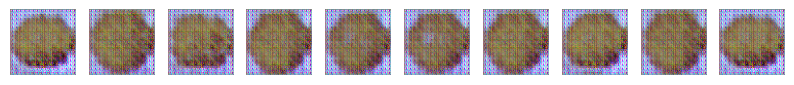

Gen Loss: tensor(1.1771, device='cuda:0', grad_fn=<MeanBackward0>)
Des Loss: tensor(1.3758, device='cuda:0', grad_fn=<MeanBackward0>)


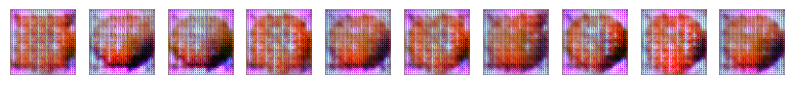

Gen Loss: tensor(1.5664, device='cuda:0', grad_fn=<MeanBackward0>)
Des Loss: tensor(1.2736, device='cuda:0', grad_fn=<MeanBackward0>)


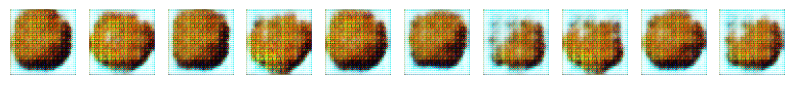

Gen Loss: tensor(1.3873, device='cuda:0', grad_fn=<MeanBackward0>)
Des Loss: tensor(1.2932, device='cuda:0', grad_fn=<MeanBackward0>)


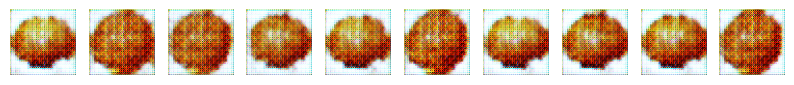

Gen Loss: tensor(1.4994, device='cuda:0', grad_fn=<MeanBackward0>)
Des Loss: tensor(1.2636, device='cuda:0', grad_fn=<MeanBackward0>)


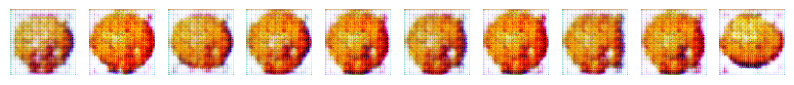

Gen Loss: tensor(1.1133, device='cuda:0', grad_fn=<MeanBackward0>)
Des Loss: tensor(1.3120, device='cuda:0', grad_fn=<MeanBackward0>)


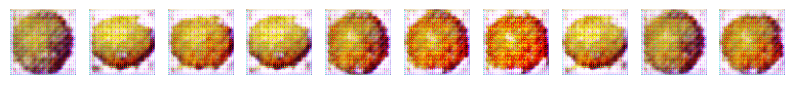

Gen Loss: tensor(1.0493, device='cuda:0', grad_fn=<MeanBackward0>)
Des Loss: tensor(1.3403, device='cuda:0', grad_fn=<MeanBackward0>)


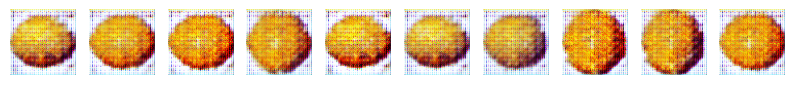

Gen Loss: tensor(1.0866, device='cuda:0', grad_fn=<MeanBackward0>)
Des Loss: tensor(1.3225, device='cuda:0', grad_fn=<MeanBackward0>)


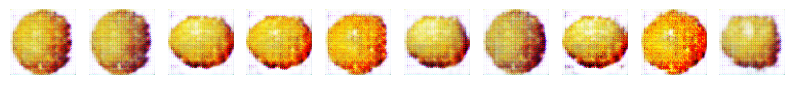

Gen Loss: tensor(1.0097, device='cuda:0', grad_fn=<MeanBackward0>)
Des Loss: tensor(1.3424, device='cuda:0', grad_fn=<MeanBackward0>)


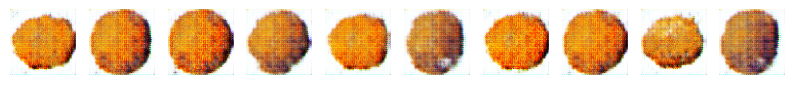

Gen Loss: tensor(1.1922, device='cuda:0', grad_fn=<MeanBackward0>)
Des Loss: tensor(1.2909, device='cuda:0', grad_fn=<MeanBackward0>)


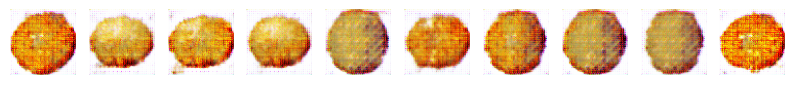

In [74]:
# Training Loop   
def training_loop(gen_lr, des_lr, epochs):
    
    # Initializing the optimizers 
    gen_opt = torch.optim.AdamW(generator.parameters(), lr=gen_lr, betas=(0.5,0.999))
    des_opt = torch.optim.AdamW(descriminator.parameters(), lr=des_lr, betas=(0.5,0.999))      
        
    for epoch in range(epochs):
        g_loss_list = []
        d_loss_list = []
    
        for i, batch in enumerate(dataloader, 0):
            
            # Training the descriminator on the real images
            des_opt.zero_grad(set_to_none=True)
            predict = descriminator(batch.float())
            d_loss = F.binary_cross_entropy(predict, torch.ones((len(predict),1), device=device)) 
            d_loss.backward()
            
            # Training the descriminator on the fake images
            rand_noise = torch.randn(batch_size, 100, device=device)
            gen_img = generator(rand_noise)
            predict = descriminator(gen_img.detach().to(device))
            d_loss_fake = F.binary_cross_entropy(predict,torch.zeros((len(predict),1), device=device))
            d_loss_fake.backward()
            des_opt.step()
        
            # Training the generator on the descriminator's feedback
            gen_opt.zero_grad(set_to_none=True)
            predict = descriminator(gen_img)
            g_loss = F.binary_cross_entropy(predict,torch.ones((len(predict),1), device=device))
            g_loss.backward()
            gen_opt.step()
            
            # Storing the losses
            g_loss_list.append(g_loss)
            d_loss_list.append(d_loss + d_loss_fake)

        # Print the avg loss for the epoch
        print('Gen Loss:', torch.mean(torch.stack(g_loss_list))) 
        print('Des Loss:', torch.mean(torch.stack(d_loss_list)))
        
        # Plot 10 fake lemon
        fig, axes = plt.subplots(nrows=1, ncols=10, figsize=(10,1))
        for i in range(10):
            axes[i].axis('off')
            axes[i].imshow(torch.transpose(gen_img[i], 0, 2).cpu().detach().numpy())
        plt.show()
    
training_loop(.007, .007, 10)

Gen Loss: tensor(0.8895, device='cuda:0', grad_fn=<MeanBackward0>)
Des Loss: tensor(1.2803, device='cuda:0', grad_fn=<MeanBackward0>)


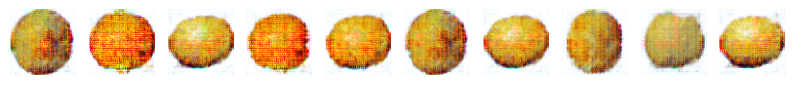

Gen Loss: tensor(0.8930, device='cuda:0', grad_fn=<MeanBackward0>)
Des Loss: tensor(1.3186, device='cuda:0', grad_fn=<MeanBackward0>)


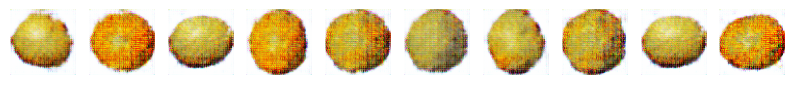

Gen Loss: tensor(0.9510, device='cuda:0', grad_fn=<MeanBackward0>)
Des Loss: tensor(1.2640, device='cuda:0', grad_fn=<MeanBackward0>)


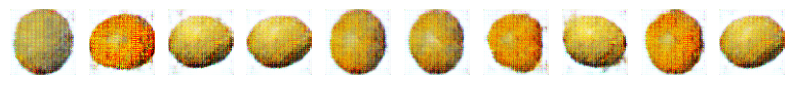

Gen Loss: tensor(0.9434, device='cuda:0', grad_fn=<MeanBackward0>)
Des Loss: tensor(1.3210, device='cuda:0', grad_fn=<MeanBackward0>)


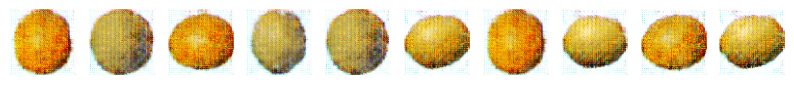

Gen Loss: tensor(0.9781, device='cuda:0', grad_fn=<MeanBackward0>)
Des Loss: tensor(1.2847, device='cuda:0', grad_fn=<MeanBackward0>)


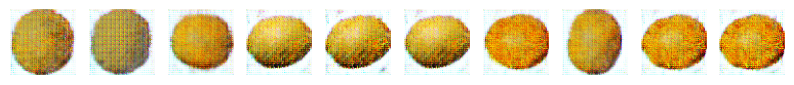

Gen Loss: tensor(0.9934, device='cuda:0', grad_fn=<MeanBackward0>)
Des Loss: tensor(1.2619, device='cuda:0', grad_fn=<MeanBackward0>)


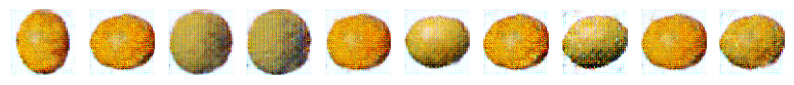

Gen Loss: tensor(1.0479, device='cuda:0', grad_fn=<MeanBackward0>)
Des Loss: tensor(1.2937, device='cuda:0', grad_fn=<MeanBackward0>)


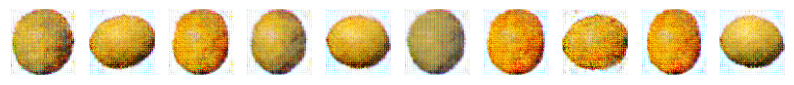

Gen Loss: tensor(1.0079, device='cuda:0', grad_fn=<MeanBackward0>)
Des Loss: tensor(1.2625, device='cuda:0', grad_fn=<MeanBackward0>)


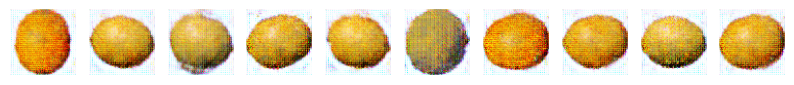

Gen Loss: tensor(1.0730, device='cuda:0', grad_fn=<MeanBackward0>)
Des Loss: tensor(1.2569, device='cuda:0', grad_fn=<MeanBackward0>)


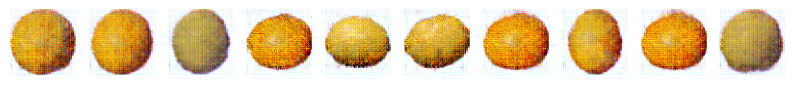

Gen Loss: tensor(1.1981, device='cuda:0', grad_fn=<MeanBackward0>)
Des Loss: tensor(1.2193, device='cuda:0', grad_fn=<MeanBackward0>)


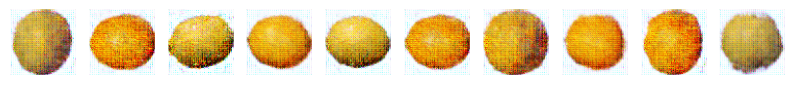

In [75]:
# Lowering the learning rate
training_loop(.001, .001, 10)


Epoch 1/10
Gen Loss: 1.2391
Des Loss: 1.1472


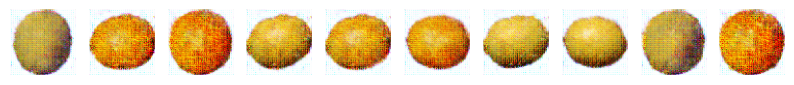

Epoch 2/10
Gen Loss: 1.3325
Des Loss: 1.1333


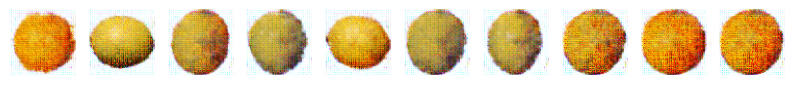

Epoch 3/10
Gen Loss: 1.3413
Des Loss: 1.1358


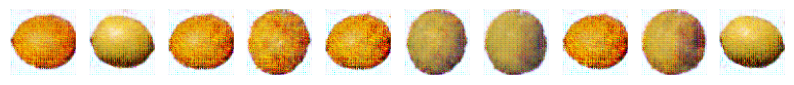

Epoch 4/10
Gen Loss: 1.2746
Des Loss: 1.1550


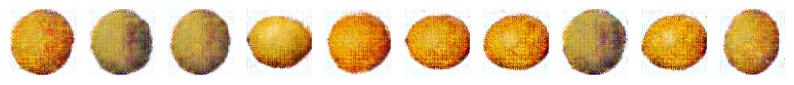

Epoch 5/10
Gen Loss: 1.3647
Des Loss: 1.1313


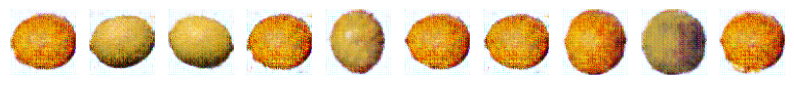

Epoch 6/10
Gen Loss: 1.5350
Des Loss: 1.0570


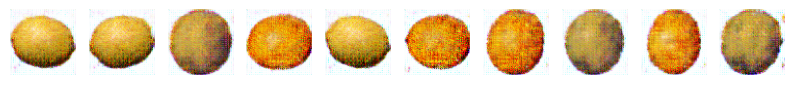

Epoch 7/10
Gen Loss: 1.4762
Des Loss: 1.0974


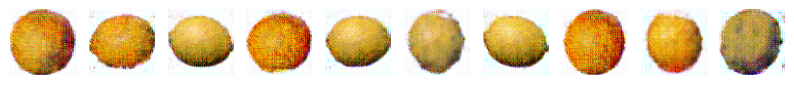

Epoch 8/10
Gen Loss: 1.5583
Des Loss: 1.0720


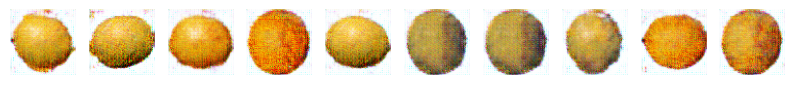

Epoch 9/10
Gen Loss: 1.5460
Des Loss: 1.0936


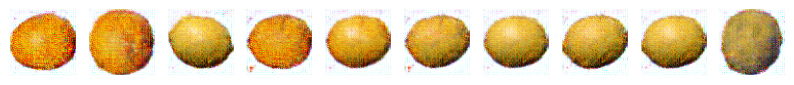

Epoch 10/10
Gen Loss: 1.4099
Des Loss: 1.1544


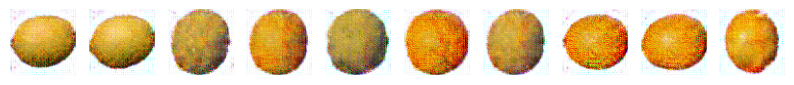

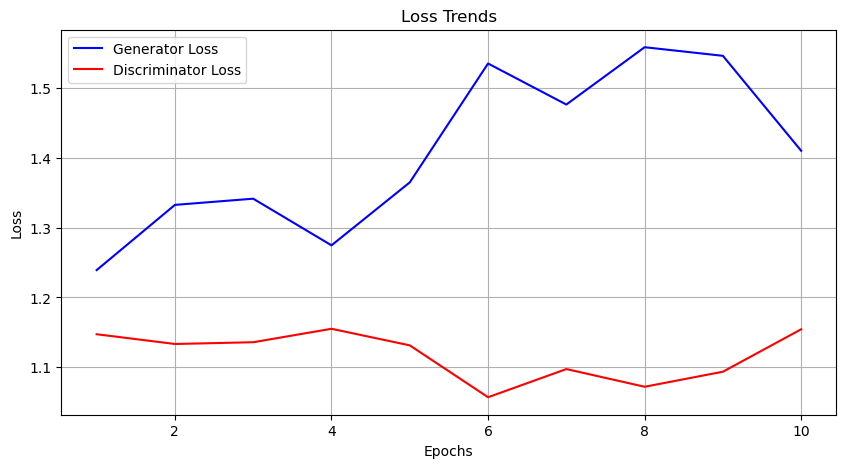

In [76]:
# Training Loop   
def training_loop(gen_lr, des_lr, epochs):
    # Initializing the optimizers 
    gen_opt = torch.optim.AdamW(generator.parameters(), lr=gen_lr, betas=(0.5, 0.999))
    des_opt = torch.optim.AdamW(descriminator.parameters(), lr=des_lr, betas=(0.5, 0.999))      
    
    g_loss_history = []
    d_loss_history = []

    for epoch in range(epochs):
        g_loss_list = []
        d_loss_list = []
    
        for i, batch in enumerate(dataloader, 0):
            # Training the discriminator on the real images
            des_opt.zero_grad(set_to_none=True)
            predict = descriminator(batch.float())
            d_loss_real = F.binary_cross_entropy(predict, torch.ones((len(predict), 1), device=device)) 
            d_loss_real.backward()

            # Training the discriminator on the fake images
            rand_noise = torch.randn(batch_size, 100, device=device)
            gen_img = generator(rand_noise)
            predict = descriminator(gen_img.detach().to(device))
            d_loss_fake = F.binary_cross_entropy(predict, torch.zeros((len(predict), 1), device=device))
            d_loss_fake.backward()
            des_opt.step()
            
            # Total discriminator loss
            d_loss = d_loss_real + d_loss_fake
            d_loss_list.append(d_loss)

            # Training the generator on the discriminator's feedback
            gen_opt.zero_grad(set_to_none=True)
            predict = descriminator(gen_img)
            g_loss = F.binary_cross_entropy(predict, torch.ones((len(predict), 1), device=device))
            g_loss.backward()
            gen_opt.step()
            
            # Storing the generator loss
            g_loss_list.append(g_loss)

        # Calculate and store average losses for the epoch
        avg_g_loss = torch.mean(torch.stack(g_loss_list))
        avg_d_loss = torch.mean(torch.stack(d_loss_list))
        g_loss_history.append(avg_g_loss.item())
        d_loss_history.append(avg_d_loss.item())

        # Print the average loss for the epoch
        print(f'Epoch {epoch+1}/{epochs}')
        print(f'Gen Loss: {avg_g_loss:.4f}') 
        print(f'Des Loss: {avg_d_loss:.4f}')
        
        # Plot 10 fake lemon (generated images)
        fig, axes = plt.subplots(nrows=1, ncols=10, figsize=(10, 1))
        for i in range(10):
            axes[i].axis('off')
            axes[i].imshow(torch.transpose(gen_img[i], 0, 2).cpu().detach().numpy())
        plt.show()
    
    # Plot the loss trends after training
    plt.figure(figsize=(10, 5))
    plt.plot(range(1, epochs + 1), g_loss_history, label='Generator Loss', color='blue')
    plt.plot(range(1, epochs + 1), d_loss_history, label='Discriminator Loss', color='red')
    plt.title('Loss Trends')
    plt.xlabel('Epochs')
    plt.ylabel('Loss')
    plt.legend()
    plt.grid(True)
    plt.show()

# Run the training loop
training_loop(.001, .001, 10)


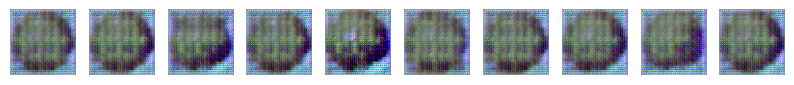

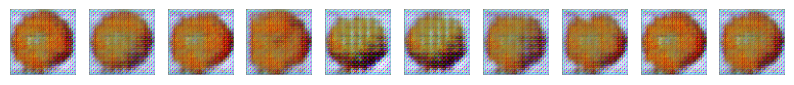

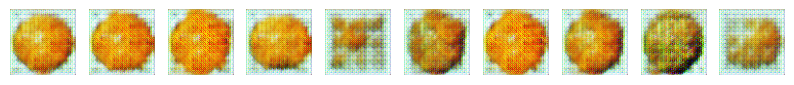

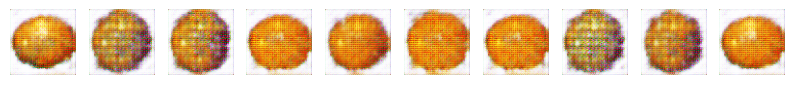

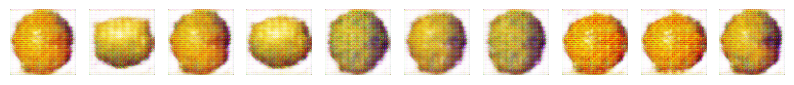

...

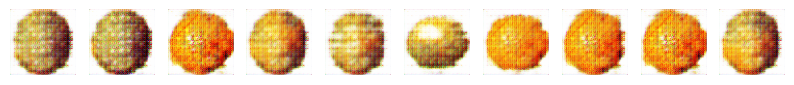

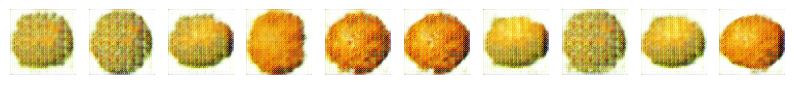

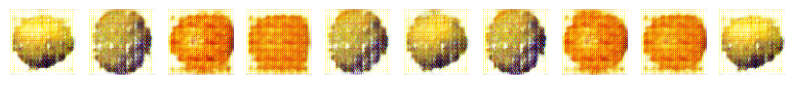

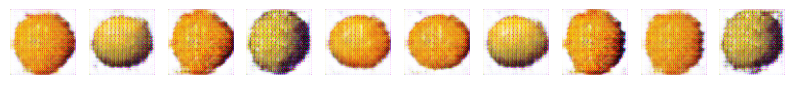

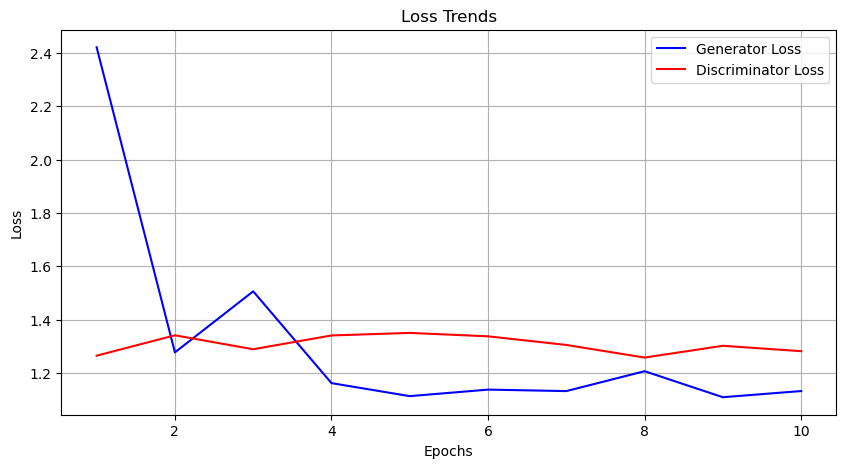

In [29]:
# Training Loop   
def training_loop(gen_lr, des_lr, epochs):
    # Initializing the optimizers 
    gen_opt = torch.optim.AdamW(generator.parameters(), lr=gen_lr, betas=(0.5, 0.999))
    des_opt = torch.optim.AdamW(descriminator.parameters(), lr=des_lr, betas=(0.5, 0.999))      
    
    g_loss_history = []
    d_loss_history = []

    for epoch in range(epochs):
        g_loss_list = []
        d_loss_list = []
    
        for i, batch in enumerate(dataloader, 0):
            # Training the discriminator on the real images
            des_opt.zero_grad(set_to_none=True)
            predict = descriminator(batch.float())
            d_loss_real = F.binary_cross_entropy(predict, torch.ones((len(predict), 1), device=device)) 
            d_loss_real.backward()

            # Training the discriminator on the fake images
            rand_noise = torch.randn(batch_size, 100, device=device)
            gen_img = generator(rand_noise)
            predict = descriminator(gen_img.detach().to(device))
            d_loss_fake = F.binary_cross_entropy(predict, torch.zeros((len(predict), 1), device=device))
            d_loss_fake.backward()
            des_opt.step()
            
            # Total discriminator loss
            d_loss = d_loss_real + d_loss_fake
            d_loss_list.append(d_loss)

            # Training the generator on the discriminator's feedback
            gen_opt.zero_grad(set_to_none=True)
            predict = descriminator(gen_img)
            g_loss = F.binary_cross_entropy(predict, torch.ones((len(predict), 1), device=device))
            g_loss.backward()
            gen_opt.step()
            
            # Storing the generator loss
            g_loss_list.append(g_loss)

        # Calculate and store average losses for the epoch
        avg_g_loss = torch.mean(torch.stack(g_loss_list))
        avg_d_loss = torch.mean(torch.stack(d_loss_list))
        g_loss_history.append(avg_g_loss.item())
        d_loss_history.append(avg_d_loss.item())

        # # Print the average loss for the epoch
        # print(f'Epoch {epoch+1}/{epochs}')
        # print(f'Gen Loss: {avg_g_loss:.4f}') 
        # print(f'Des Loss: {avg_d_loss:.4f}')
        
        # Plot 10 fake lemon (generated images)
        fig, axes = plt.subplots(nrows=1, ncols=10, figsize=(10, 2))
        for i in range(10):
            axes[i].axis('off')
            axes[i].imshow(torch.transpose(gen_img[i], 0, 2).cpu().detach().numpy())
        plt.show()
    
    # Plot the loss trends after training
    plt.figure(figsize=(10, 5))
    plt.plot(range(1, epochs + 1), g_loss_history, label='Generator Loss', color='blue')
    plt.plot(range(1, epochs + 1), d_loss_history, label='Discriminator Loss', color='red')
    plt.title('Loss Trends')
    plt.xlabel('Epochs')
    plt.ylabel('Loss')
    plt.legend()
    plt.grid(True)
    plt.show()

# Run the training loop
training_loop(.007, .007, 10)


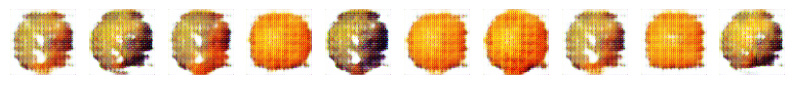

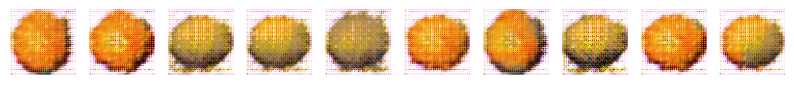

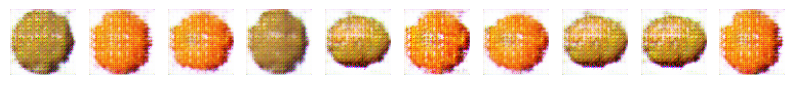

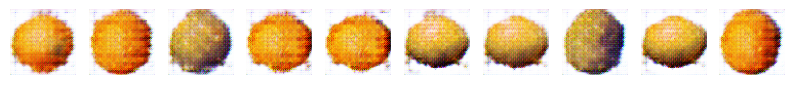

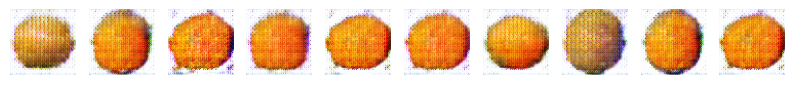

...

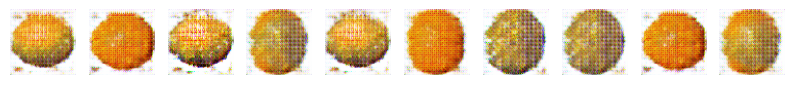

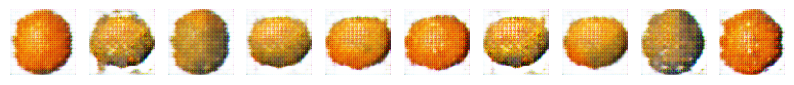

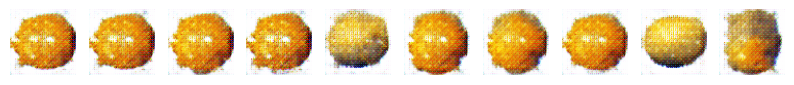

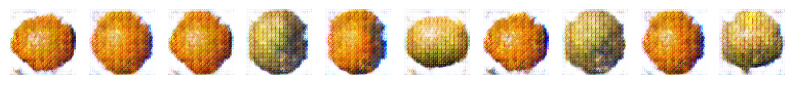

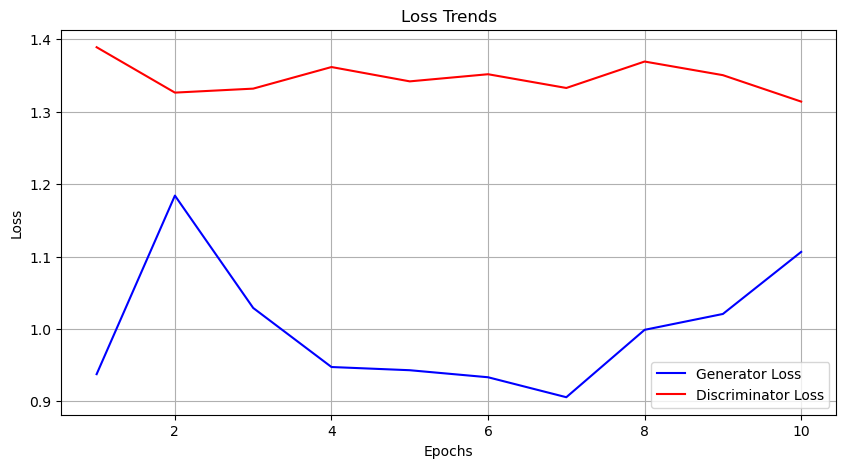

In [30]:
# Training Loop   
def training_loop(gen_lr, des_lr, epochs):
    # Initializing the optimizers 
    gen_opt = torch.optim.AdamW(generator.parameters(), lr=gen_lr, betas=(0.5, 0.999))
    des_opt = torch.optim.AdamW(descriminator.parameters(), lr=des_lr, betas=(0.5, 0.999))      
    
    g_loss_history = []
    d_loss_history = []

    for epoch in range(epochs):
        g_loss_list = []
        d_loss_list = []
    
        for i, batch in enumerate(dataloader, 0):
            # Training the discriminator on the real images
            des_opt.zero_grad(set_to_none=True)
            predict = descriminator(batch.float())
            d_loss_real = F.binary_cross_entropy(predict, torch.ones((len(predict), 1), device=device)) 
            d_loss_real.backward()

            # Training the discriminator on the fake images
            rand_noise = torch.randn(batch_size, 100, device=device)
            gen_img = generator(rand_noise)
            predict = descriminator(gen_img.detach().to(device))
            d_loss_fake = F.binary_cross_entropy(predict, torch.zeros((len(predict), 1), device=device))
            d_loss_fake.backward()
            des_opt.step()
            
            # Total discriminator loss
            d_loss = d_loss_real + d_loss_fake
            d_loss_list.append(d_loss)

            # Training the generator on the discriminator's feedback
            gen_opt.zero_grad(set_to_none=True)
            predict = descriminator(gen_img)
            g_loss = F.binary_cross_entropy(predict, torch.ones((len(predict), 1), device=device))
            g_loss.backward()
            gen_opt.step()
            
            # Storing the generator loss
            g_loss_list.append(g_loss)

        # Calculate and store average losses for the epoch
        avg_g_loss = torch.mean(torch.stack(g_loss_list))
        avg_d_loss = torch.mean(torch.stack(d_loss_list))
        g_loss_history.append(avg_g_loss.item())
        d_loss_history.append(avg_d_loss.item())

        # # Print the average loss for the epoch
        # print(f'Epoch {epoch+1}/{epochs}')
        # print(f'Gen Loss: {avg_g_loss:.4f}') 
        # print(f'Des Loss: {avg_d_loss:.4f}')
        
        # Plot 10 fake lemon (generated images)
        fig, axes = plt.subplots(nrows=1, ncols=10, figsize=(10, 2))
        for i in range(10):
            axes[i].axis('off')
            axes[i].imshow(torch.transpose(gen_img[i], 0, 2).cpu().detach().numpy())
        plt.show()
    
    # Plot the loss trends after training
    plt.figure(figsize=(10, 5))
    plt.plot(range(1, epochs + 1), g_loss_history, label='Generator Loss', color='blue')
    plt.plot(range(1, epochs + 1), d_loss_history, label='Discriminator Loss', color='red')
    plt.title('Loss Trends')
    plt.xlabel('Epochs')
    plt.ylabel('Loss')
    plt.legend()
    plt.grid(True)
    plt.show()

# Run the training loop
training_loop(.007, .007, 10)


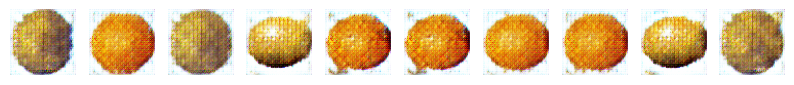

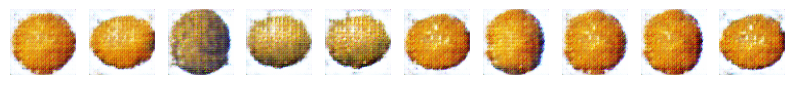

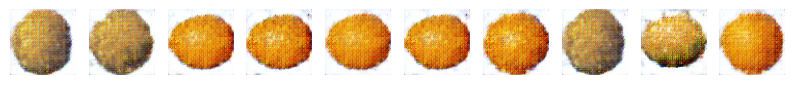

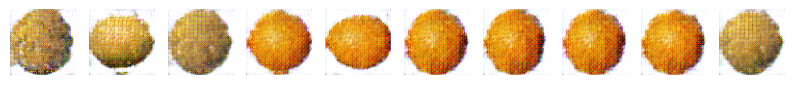

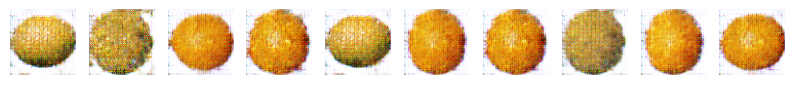

...

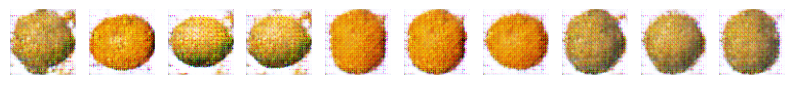

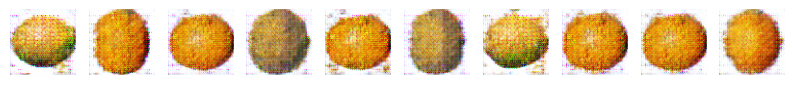

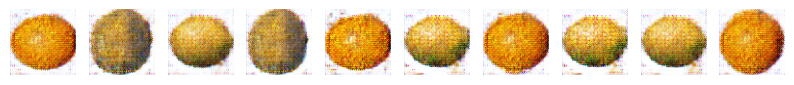

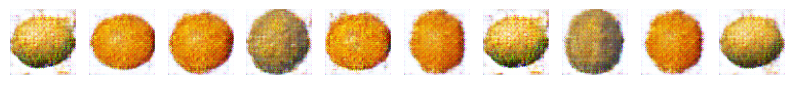

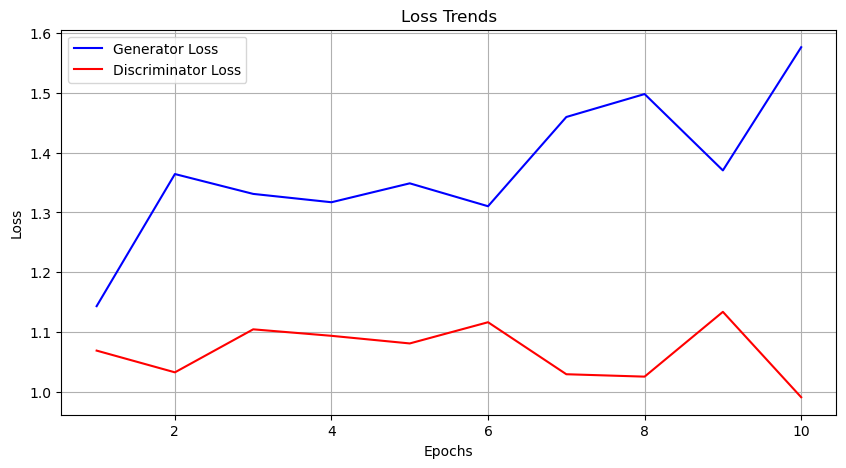

In [31]:
# Training Loop   
def training_loop(gen_lr, des_lr, epochs):
    # Initializing the optimizers 
    gen_opt = torch.optim.AdamW(generator.parameters(), lr=gen_lr, betas=(0.5, 0.999))
    des_opt = torch.optim.AdamW(descriminator.parameters(), lr=des_lr, betas=(0.5, 0.999))      
    
    g_loss_history = []
    d_loss_history = []

    for epoch in range(epochs):
        g_loss_list = []
        d_loss_list = []
    
        for i, batch in enumerate(dataloader, 0):
            # Training the discriminator on the real images
            des_opt.zero_grad(set_to_none=True)
            predict = descriminator(batch.float())
            d_loss_real = F.binary_cross_entropy(predict, torch.ones((len(predict), 1), device=device)) 
            d_loss_real.backward()

            # Training the discriminator on the fake images
            rand_noise = torch.randn(batch_size, 100, device=device)
            gen_img = generator(rand_noise)
            predict = descriminator(gen_img.detach().to(device))
            d_loss_fake = F.binary_cross_entropy(predict, torch.zeros((len(predict), 1), device=device))
            d_loss_fake.backward()
            des_opt.step()
            
            # Total discriminator loss
            d_loss = d_loss_real + d_loss_fake
            d_loss_list.append(d_loss)

            # Training the generator on the discriminator's feedback
            gen_opt.zero_grad(set_to_none=True)
            predict = descriminator(gen_img)
            g_loss = F.binary_cross_entropy(predict, torch.ones((len(predict), 1), device=device))
            g_loss.backward()
            gen_opt.step()
            
            # Storing the generator loss
            g_loss_list.append(g_loss)

        # Calculate and store average losses for the epoch
        avg_g_loss = torch.mean(torch.stack(g_loss_list))
        avg_d_loss = torch.mean(torch.stack(d_loss_list))
        g_loss_history.append(avg_g_loss.item())
        d_loss_history.append(avg_d_loss.item())

        # # Print the average loss for the epoch
        # print(f'Epoch {epoch+1}/{epochs}')
        # print(f'Gen Loss: {avg_g_loss:.4f}') 
        # print(f'Des Loss: {avg_d_loss:.4f}')
        
        # Plot 10 fake lemon (generated images)
        fig, axes = plt.subplots(nrows=1, ncols=10, figsize=(10, 2))
        for i in range(10):
            axes[i].axis('off')
            axes[i].imshow(torch.transpose(gen_img[i], 0, 2).cpu().detach().numpy())
        plt.show()
    
    # Plot the loss trends after training
    plt.figure(figsize=(10, 5))
    plt.plot(range(1, epochs + 1), g_loss_history, label='Generator Loss', color='blue')
    plt.plot(range(1, epochs + 1), d_loss_history, label='Discriminator Loss', color='red')
    plt.title('Loss Trends')
    plt.xlabel('Epochs')
    plt.ylabel('Loss')
    plt.legend()
    plt.grid(True)
    plt.show()

# Run the training loop
training_loop(.001, .001, 10)
